In [ ]:
!pip install beautifulsoup4

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#parsing links

def extract_drug_text(link):
  link_html = request.urlopen(link).read().decode('utf8')
  new_soup = BeautifulSoup(link_html)

  interactions = new_soup.find('h2', id='interactions')
  if interactions == None:
    return

  next = interactions.find_next('ul')

  links = next.find_all('a')
  related_drug_links = []

  for link in links:
    link = 'https://www.drugs.com' + link['href']
    if 'drug-interactions' in link:
      return parse_drug_interaction_page(link)
    related_drug_links.append(link)

  return related_drug_links


In [ ]:
#for drugs that have the 'check interactions' page

def parse_drug_interaction_page(link):

  #jumping to the interactions page
  link = link.replace('.html', '-index.html')
  link_html = request.urlopen(link).read().decode('utf8')
  new_soup = BeautifulSoup(link_html)

  li_list = h_soup.find_all('li', class_='int_2')
  drug_list = []
  for li in li_list:
    link = li.find_all('a')
    drug_list.append(link['href'])

  li_list = h_soup.find_all('li', class_='int_3')
  for li in li_list:
    link = li.find_all('a')
    drug_list.append(link['href'])

  return drug_list

In [ ]:
#web scraping portion

from bs4 import BeautifulSoup
from urllib import request
import os
import json

url = 'https://www.drugs.com/drug_information.html'
html = request.urlopen(url).read().decode('utf8')

soup = BeautifulSoup(html)

letters = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z', '0-9']

webpages = []
for letter in letters:

  top_level_url = 'https://www.drugs.com/alpha/' + letter + '.html'
  top_level_html = request.urlopen(top_level_url).read().decode('utf8')
  top_level_soup = BeautifulSoup(top_level_html)

  letter_pairs_list = top_level_soup.find('nav', class_='ddc-paging ddc-mgb-2')
  if letter_pairs_list == None:
    continue

  webpages = letter_pairs_list.find_all('a')
  if webpages == None:
    continue

  dict_related_drug_links = {}

  for page in webpages:

    page_link = 'https://www.drugs.com' + page['href']
    print(f'doing page {page_link}:')

    html = request.urlopen(page_link).read().decode('utf8')
    h_soup = BeautifulSoup(html)

    drug_list = h_soup.find('ul', class_='ddc-list-column-2')
    if drug_list == None:
      continue

    links = drug_list.find_all('a')


    for link in links:

      link = 'https://www.drugs.com' + link['href']
      related_drug_links = extract_drug_text(link)
      dict_related_drug_links[link] = related_drug_links

    filename = '/content/drive/MyDrive/drug_interactions/' + page['href'].replace('/', '_') + '.json'

    with open(filename, 'w') as f:
      json.dump(dict_related_drug_links, f, indent=4)


doing page https://www.drugs.com/alpha/ab.html:
doing page https://www.drugs.com/alpha/ac.html:
doing page https://www.drugs.com/alpha/ad.html:


KeyboardInterrupt: 

In [ ]:
import os
import json

# merge json files to create database

path = '/content/drive/MyDrive/drug_interactions'
files_in_path = os.listdir(path)
files_in_path.remove('.ipynb_checkpoints')

files = []
for f in files_in_path:
  f =  '/content/drive/MyDrive/drug_interactions/' + f #have to include the path to avoid error
  with open(f, 'r') as file:
    files.append(json.load(file))   #add all the files in one place

new_path = '/content/drive/MyDrive/merged_drug_interactions_file/' + 'combined_JSONs.json' #create new json file in path

with open(new_path, 'w') as o:
  json.dump(files, o, indent=4)   #put all content from files in one place in new path

In [ ]:
#create pandas DB from our merged json file
import pandas as pd
import json

path = '/content/drive/MyDrive/merged_drug_interactions_file/combined_JSONs.json'
with open(path, 'r') as path:
    json_data = json.load(path)

drug_names = []
drugs_that_interact_w_drugname = []

#putting stuff from json into 2 columns for the df
for drug in json_data:   #each drug has the drug name and the interactions list
    for c1, c2 in drug.items():  #c1 = drug, c2 = interactions list
        drug_names.append(c1)   #add drug name to list of names (drug name column)
        if c2 is None:    #if no interactions, is None
            drugs_that_interact_w_drugname.append('') #empty string bc there's nothing in the list, avoid error w/ join
        else:
            drugs_that_interact_w_drugname.append(', '.join(c2))  #create comma separated list in column of drugs

#creating the df using the two filled columns we've created
drug_interactions_db = pd.DataFrame(columns=['drug name', 'list of drugs that interact'])
drug_interactions_db['drug name'] = drug_names
drug_interactions_db['list of drugs that interact'] = drugs_that_interact_w_drugname

In [ ]:
drug_interactions_db

In [ ]:
import os

# Define the directory path
directory = '/content/drive/MyDrive/drug_interactions/database'

# Create the directory if it doesn't exist
os.makedirs(directory, exist_ok=True)

# Define the full file path
file_path = os.path.join(directory, 'drug_interactions_db.csv')

# Save the DataFrame to the file
drug_interactions_db.to_csv(file_path)

In [ ]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/drug_interactions/database/drug_interactions_db.csv', index_col=0)
df

,drug name,list of drugs that interact
0,https://www.drugs.com/cons/a-b-otic.html,NaN
1,https://www.drugs.com/mtm/abacavir.html,"https://www.drugs.com/mtm/riociguat.html, http..."
2,https://www.drugs.com/mtm/abacavir-and-lamivud...,NaN
3,https://www.drugs.com/pro/abacavir-and-lamivud...,NaN
4,https://www.drugs.com/pro/abacavir-oral-soluti...,NaN
...,...,...
89248,https://www.drugs.com/pro/zyvana.html,NaN
89249,https://www.drugs.com/zyvox.html,NaN
89250,https://www.drugs.com/cons/zyvox-linezolid-int...,NaN
89251,https://www.drugs.com/cons/zyvox-linezolid-ora...,NaN


#Data Cleaning
  - Drop Rows where interactions list is empty
  - extract names from links / delete extra noise (links that have nothing to do w/ interactions) (regex?)
  - noise --> strings containing anything but drug names before the .html
  ex. 'sickness', 'pregnancy', 'symptoms', 'image', disease names

In [ ]:
import pandas as pd
import os
import re

In [ ]:
df.rename(columns={'drug name': 'query_drug_link', 'list of drugs that interact': 'interaction_drug_link'}, inplace=True)
df

,query_drug_link,interaction_drug_link
0,https://www.drugs.com/cons/a-b-otic.html,NaN
1,https://www.drugs.com/mtm/abacavir.html,"https://www.drugs.com/mtm/riociguat.html, http..."
2,https://www.drugs.com/mtm/abacavir-and-lamivud...,NaN
3,https://www.drugs.com/pro/abacavir-and-lamivud...,NaN
4,https://www.drugs.com/pro/abacavir-oral-soluti...,NaN
...,...,...
89248,https://www.drugs.com/pro/zyvana.html,NaN
89249,https://www.drugs.com/zyvox.html,NaN
89250,https://www.drugs.com/cons/zyvox-linezolid-int...,NaN
89251,https://www.drugs.com/cons/zyvox-linezolid-ora...,NaN


In [ ]:
import re

def get_drug_names(row, pattern):
    drug_name = row['drug_names']
    url = row['query_drug_link']

    if drug_name is None:
        matched_result = re.match(pattern, url)
        if matched_result:
            matched_string = matched_result.group(1)  # Access the first captured group
            return matched_string
        else:
            return None

In [ ]:
def get_drug_names_all(row, pattern):
    drug_name = row['interaction_drug_names']
    url = row['interaction_drug_link']

    if drug_name is None:
        if pd.isna(url):
            return None
        else:
            result = re.findall(pattern, url)
            if result:
                return result
            else:
                return None

In [ ]:
def incorrect_information_removal(row):
    drug_names = row['interaction_drug_names']
    words_to_remove = ['pregnancy', 'disease', 'illness', 'sickness', 'person', 'image', 'diabetes', 'hyperglycemia', 'side-effects', "side effects"]

    if drug_names is None:
        return []

    updated_drug_names = []
    updated_drug_names = [drug for drug in drug_names if not any(word in drug.lower() for word in words_to_remove)]

    return updated_drug_names if updated_drug_names else []

In [ ]:
# drug_name = df['interaction_drug_names'][1]
# isinstance(drug_name, list)

In [ ]:
# pattern_1 = r"https?:\/\/www\.drugs\.com\/[a-z]+\/([a-zA-Z0-9-]+)\.html?"
# pattern_2 = r'https?:\/\/www\.drugs\.com\/([a-zA-Z0-9-]+)\.html?'
# pattern_3 = r'https?:\/\/www\.drugs\.com\/(?:[a-z]+\/)?([a-zA-Z0-9-]+)\.html?'
pattern_4 = r'https?:\/\/www\.drugs\.com\/(?:[a-z]+\/)?([a-zA-Z0-9_-]+)\.html?'


df['drug_names'] = None
df['interaction_drug_names'] = None

for index, row in df.iterrows():
    matched_name = get_drug_names(row, pattern_4)
    df.loc[index, 'drug_names'] = matched_name

    matched_name = get_drug_names_all(row, pattern_4)
    df.at[index, 'interaction_drug_names'] = matched_name

df['interaction_drug_names'] = df.apply(incorrect_information_removal, axis=1)

df

,query_drug_link,interaction_drug_link,drug_names,interaction_drug_names
0,https://www.drugs.com/cons/a-b-otic.html,NaN,a-b-otic,[]
1,https://www.drugs.com/mtm/abacavir.html,"https://www.drugs.com/mtm/riociguat.html, http...",abacavir,"[riociguat, methadone]"
2,https://www.drugs.com/mtm/abacavir-and-lamivud...,NaN,abacavir-and-lamivudine,[]
3,https://www.drugs.com/pro/abacavir-and-lamivud...,NaN,abacavir-and-lamivudine-tablets,[]
4,https://www.drugs.com/pro/abacavir-oral-soluti...,NaN,abacavir-oral-solution,[]
...,...,...,...,...
89248,https://www.drugs.com/pro/zyvana.html,NaN,zyvana,[]
89249,https://www.drugs.com/zyvox.html,NaN,zyvox,[]
89250,https://www.drugs.com/cons/zyvox-linezolid-int...,NaN,zyvox-linezolid-intravenous,[]
89251,https://www.drugs.com/cons/zyvox-linezolid-ora...,NaN,zyvox-linezolid-oral,[]


In [ ]:
# Define the directory path
directory = '/content/drive/MyDrive/drug_interactions/database'

# Create the directory if it doesn't exist
os.makedirs(directory, exist_ok=True)

# Define the full file path
file_path = os.path.join(directory, 'preprocessed_drug_interactions_db.csv')

# Save the DataFrame to the file
df.to_csv(file_path)

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/drug_interactions/database/preprocessed_drug_interactions_db.csv', index_col=0)
df

,query_drug_link,interaction_drug_link,drug_names,interaction_drug_names
0,https://www.drugs.com/cons/a-b-otic.html,NaN,a-b-otic,[]
1,https://www.drugs.com/mtm/abacavir.html,"https://www.drugs.com/mtm/riociguat.html, http...",abacavir,"['riociguat', 'methadone']"
2,https://www.drugs.com/mtm/abacavir-and-lamivud...,NaN,abacavir-and-lamivudine,[]
3,https://www.drugs.com/pro/abacavir-and-lamivud...,NaN,abacavir-and-lamivudine-tablets,[]
4,https://www.drugs.com/pro/abacavir-oral-soluti...,NaN,abacavir-oral-solution,[]
...,...,...,...,...
89248,https://www.drugs.com/pro/zyvana.html,NaN,zyvana,[]
89249,https://www.drugs.com/zyvox.html,NaN,zyvox,[]
89250,https://www.drugs.com/cons/zyvox-linezolid-int...,NaN,zyvox-linezolid-intravenous,[]
89251,https://www.drugs.com/cons/zyvox-linezolid-ora...,NaN,zyvox-linezolid-oral,[]


# Interaction frequency

In [ ]:
import ast
from matplotlib import pyplot as plt
from collections import Counter
import os
import pandas as pd

In [ ]:
df['interaction_drug_names'] = df['interaction_drug_names'].apply(lambda x: ast.literal_eval(x) if pd.notna(x) else [])
df_new = df.explode('interaction_drug_names')
df_new = df_new.dropna(subset=['interaction_drug_names'])
df_new


,query_drug_link,interaction_drug_link,drug_names,interaction_drug_names
1,https://www.drugs.com/mtm/abacavir.html,"https://www.drugs.com/mtm/riociguat.html, http...",abacavir,riociguat
1,https://www.drugs.com/mtm/abacavir.html,"https://www.drugs.com/mtm/riociguat.html, http...",abacavir,methadone
6,https://www.drugs.com/mtm/abacavir-dolutegravi...,https://www.drugs.com/mtm/milk-of-magnesia.htm...,abacavir-dolutegravir-and-lamivudine,milk-of-magnesia
6,https://www.drugs.com/mtm/abacavir-dolutegravi...,https://www.drugs.com/mtm/milk-of-magnesia.htm...,abacavir-dolutegravir-and-lamivudine,pepcid-complete
11,https://www.drugs.com/abatacept.html,https://www.drugs.comhttps://www.drugs.com/ada...,abatacept,adalimumab
...,...,...,...,...
89229,https://www.drugs.com/mtm/zynrelef.html,"https://www.drugs.com/warfarin.html, https://w...",zynrelef,cyclosporine-ophthalmic
89229,https://www.drugs.com/mtm/zynrelef.html,"https://www.drugs.com/warfarin.html, https://w...",zynrelef,pemetrexed
89233,https://www.drugs.com/mtm/zypitamag.html,"https://www.drugs.com/gemfibrozil.html, https:...",zypitamag,gemfibrozil
89233,https://www.drugs.com/mtm/zypitamag.html,"https://www.drugs.com/gemfibrozil.html, https:...",zypitamag,fenofibric-acid


In [ ]:
interaction_counts = Counter(df_new['drug_names'])
interaction_counts.update(df_new['interaction_drug_names'])

interaction_counts_df = pd.DataFrame(interaction_counts.items(), columns=['Drug', 'Interaction_Count'])
interaction_counts_df = interaction_counts_df.sort_values(by='Interaction_Count', ascending=False)

interaction_counts_df

,Drug,Interaction_Count
3035,coumadin,1546
1393,indomethacin,1496
1445,jantoven,1458
3034,warfarin,1355
3013,antibiotics,1105
...,...,...
1342,hyoscyamine-methenamine-methylene-blue-phenyl-...,1
1344,hypercare-topical,1
1345,hypromellose-ophthalmic,1
2065,oxyir,1


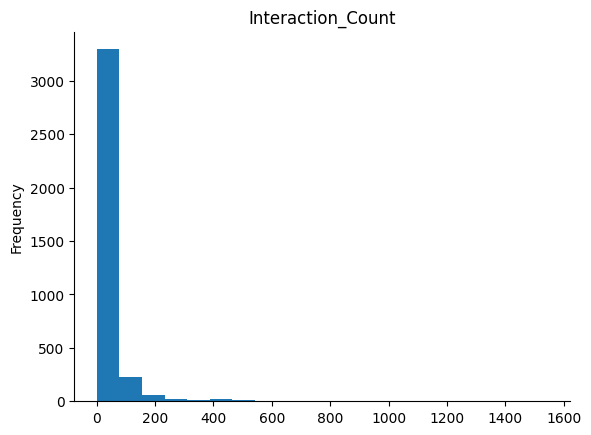

In [ ]:
interaction_counts_df['Interaction_Count'].plot(kind='hist', bins=20, title='Interaction_Count')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
# Define the directory path
directory = '/content/drive/MyDrive/drug_interactions/database'

# Create the directory if it doesn't exist
os.makedirs(directory, exist_ok=True)

# Define the full file path
file_path = os.path.join(directory, 'exploded_drug_interactions_db.csv')

# Save the DataFrame to the file
df.to_csv(file_path)

# Drug Clustering and Classification

In [ ]:
import pandas as pd
import os
from sklearn.metrics.pairwise import cosine_similarity


In [ ]:
# Create a list of all unique drugs
all_drugs = list(set(df['drug_names']).union(set(df_new['interaction_drug_names'])))

# Initialize the interaction matrix
interaction_matrix = pd.DataFrame(0, index=all_drugs, columns=all_drugs)

# Fill the interaction matrix
for index, row in df_new.iterrows():
    interaction_matrix.loc[row['drug_names'], row['interaction_drug_names']] = 1
    interaction_matrix.loc[row['interaction_drug_names'], row['drug_names']] = 1

interaction_matrix

,alburx-human,gemtuzumab-ozogamicin,generic-carbaglu,actamin,doxepin-cream,colprep-kit,carbon-dioxide,difluprednate-ophthalmic,superoxide-dismutase,heather,...,daxxify,morphabond-er,zenpep,all-day-relief,nasal-mist,hyrimoz-psoriasis-starter-pack,supress-a-pediatric,p-care-mg,allanhist-pdx-drops,eucalyptamint
alburx-human,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
gemtuzumab-ozogamicin,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
generic-carbaglu,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
actamin,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
doxepin-cream,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hyrimoz-psoriasis-starter-pack,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
supress-a-pediatric,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
p-care-mg,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
allanhist-pdx-drops,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# for column in interaction_matrix.columns:
#     unique_values = interaction_matrix[column].unique()
#     print(unique_values)

In [ ]:
# Compute the cosine similarity matrix
similarity_matrix = cosine_similarity(interaction_matrix)
similarity_df = pd.DataFrame(similarity_matrix, index=interaction_matrix.index, columns=interaction_matrix.columns)

similarity_df

,alburx-human,gemtuzumab-ozogamicin,generic-carbaglu,actamin,doxepin-cream,colprep-kit,carbon-dioxide,difluprednate-ophthalmic,superoxide-dismutase,heather,...,daxxify,morphabond-er,zenpep,all-day-relief,nasal-mist,hyrimoz-psoriasis-starter-pack,supress-a-pediatric,p-care-mg,allanhist-pdx-drops,eucalyptamint
alburx-human,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
gemtuzumab-ozogamicin,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
generic-carbaglu,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
actamin,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
doxepin-cream,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hyrimoz-psoriasis-starter-pack,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
supress-a-pediatric,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
p-care-mg,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
allanhist-pdx-drops,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# from sklearn.cluster import KMeans
# import numpy as np

# inertia_list = []
# for i in range(1, 15):
#     kmeans = KMeans(n_clusters=i, init='k-means++', random_state=18)
#     kmeans.fit(similarity_df)
#     inertia_list.append(kmeans.inertia_)

# # Plotting the Elbow graph
# plt.figure(figsize=(10,5))
# plt.plot(range(1, 15), inertia_list, marker='o', linestyle='--')
# plt.title('Elbow Method')
# plt.xlabel('Number of clusters')
# plt.ylabel('Inertia')
# plt.xticks(np.arange(1, 15, 1))
# plt.grid()

In [ ]:
# The best cluster value is about 6

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


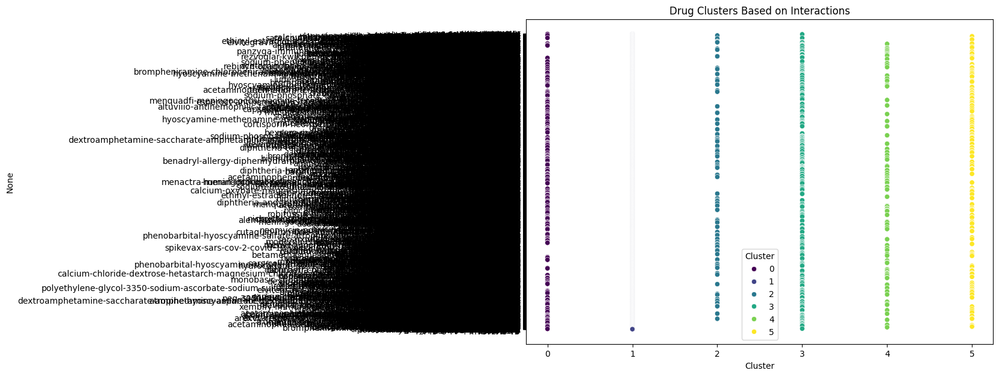

In [ ]:
num_clusters = 6
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(similarity_df)

# Add cluster labels to the DataFrame
interaction_matrix['Cluster'] = clusters

# Visualize the clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='Cluster', y=interaction_matrix.index, data=interaction_matrix.reset_index(), hue='Cluster', palette='viridis')
plt.title('Drug Clusters Based on Interactions')
plt.show()

In [ ]:
# pd.set_option('display.max_columns', None)
# cluster_1 = interaction_matrix[interaction_matrix['Cluster'] == 0]
# cluster_1

,alburx-human,gemtuzumab-ozogamicin,generic-carbaglu,actamin,doxepin-cream,colprep-kit,carbon-dioxide,difluprednate-ophthalmic,superoxide-dismutase,heather,tender-care,ultralytic-topical,delestrogen-injection,technescan-pyp,amtagvi,bp-cleansing-wash,acetazolamide-tablets,etrafon,cenafed,tetanus-immune-globulin,beclovent,mirabegron,faslodex,theocap,first-lansoprazole,narcolepsy,esomep-ezs,good-sense-children-s-allergy-relief,estradiol-gel,sotylize,altafrin,ixinity,isolyte-s-ph-7-4,levocarnitine,oxycontin,brilinta-tablets,humira-pen,cassipa,allopurinol,benicar,lutetium-lu-177-dotatate,torsemide-injection,etidronate,midol,bacillus-clausii,calanolide-a,children-s-nyquil-cold-and-cough,telmisartan-and-hydrochlorothiazide,ziprasidone-oral,bosentan-tablets,clobex-shampoo,detectnet,fazaclo,moxifloxacin-ophthalmic,dicyclomine-tablets,ferrous_sulfate,fosinvez,prilo-patch,neomycin-and-polymyxin-b-sulfates,brixadi-injection,finzala,isentress,uridine,hydrocortisone-in-absorbase,atorvastatin-and-ezetimibe,carbamazepine,bebulin-vh,septra,multitrace-5-concentrate,ciprofloxacin-ophthalmic-solution,allegra-d-12-hour-allergy-and-congestion,epoetin-beta-and-methoxy-polyethylene-glycol,crizotinib,dapiprazole-ophthalmic-solution,flecainide,apresoline-hydralazine-oral,my-way,ridactate,temovate,dextromethorphan-and-doxylamine,aquatab-dm,dolophine,butrans-patch,virasal,trillium,turqoz,aloxi-capsules,syndros,aurophen,ocean-kids-nasal,alvesco,lanoxin-pediatric-digoxin-intramuscular-intravenous,collagenase-clostridium-histolyticum-aaes,econazole,good-sense-allergy-relief-fluticasone,inositol-hexaphosphate,brexpiprazole,infasurf,busulfan-oral-injection,phenobarbital-oral-solution,sunmark-miconazole-7,isotretinoin-eqv-absorica,santyl,lanadelumab-flyo,taytulla-birth-control,duetdha-balanced,avacincaptad-pegol,tylenol-cold-flu-multi-action-day-night-extra-strength,mar-cof-cg,docetaxel,rid-a-pain,austedo-xr,ddavp-desmopressin-oral,ixifi-infliximab-qbtx-intravenous,combogesic-iv,mechlorethamine,sarecycline,cyclosporine-oral-injection,sinus-and-allergy-pe,bromfed-dm,melatonin-sleep,omega-3-carboxylic-acids,amitriptyline-and-chlordiazepoxide,risedronate,famotidine-tablets,hydrocodone-and-ibuprofen,emgel,intersol,microgestin-1-20,naprelan-500,acetaminophen-injection,aralast-np,brimonidine-topical,crotan-lotion,depocyt,xaquil-xr,tocainide,compound-w-one-step-plantar-pads,hydrocodone-and-chlorpheniramine-solution,triaminic-night-time-cough-and-runny-nose,zosyn-in-galaxy-containers,cipro-iv,bekyree,butalbital-and-acetaminophen,calcium-carbonate-magnesium-hydroxide-and-simethicone,blink-gel-tears,clindamycin-topical-solution,hydrocortisone-enema,insulin-aspart-injection,fluorouracil-topical-solution,humulin-l,lisdexamfetamine-dimesylate-chewable-tablets,metipranolol,rotigotine-transdermal,triamcinolone-eent,clofibrate,cangrelor,reditrex,clonidine-extended-release-tablets,loprox-ts,children-s-robitussin-cough-and-chest-congestion-dm,glycron-glyburide-micronized-oral,ribavirin-inhalation-solution,rezira,clindamycin-and-tretinoin,vancomycin-oral-solution,low-ogestrel,ruxolitinib-topical-application,positive-skin-test-control-histamine,piperonyl-butoxide-and-pyrethrins-topical,sars-cov-2-covid-19-vaccine-mrna-lnp-spike-protein-moderna,gadoxetate,wine,ado-trastuzumab-emtansine,amlexanox,daybue-oral-solution,merrem-iv,crofab-ovine,metatrace-fdg,methacholine,tri-lo-sprintec,sensorcaine,clarinex-d,triclabendazole,darvocet-a500,vancomycin-oral,dexpak-13-day-taperpak,chlordiazepoxide-and-clidinium,phenagil,pedia-lax-liquid-rectal,atelvia,faststat-topical-hemostat,allegra_d,cobal,orphenadrine-w-a-c,probalan,e-s-p,comvax,primadophilus-bifidus,zovirax-cream,cyclocort,ala-quin-cream,nature-s-blend-folic-acid,amiodarone-intravenous,apexicon,first-omeprazole,lidex-ointment,nicotine-transdermal-system,systane-balance,osmoglyn,beleodaq,sodium-hyaluronate-injection,papaya,kerasal-al,fe-vite-drops,deltasone,gemtesa,theracran-hp,meloxicam-capsules,ceftriaxone-injection,pain-stick-sports-

In [ ]:
# Define the directory path
directory = '/content/drive/MyDrive/drug_interactions/database'

# Create the directory if it doesn't exist
os.makedirs(directory, exist_ok=True)

# Define the full file path
file_path = os.path.join(directory, 'interactions_matrix.csv')

# Save the DataFrame to the file
df.to_csv(file_path)

In [ ]:
interaction_matrix = pd.read_csv('/content/drive/MyDrive/drug_interactions/database/interactions_matrix.csv', index_col=0)
interaction_matrix

,query_drug_link,interaction_drug_link,drug_names,interaction_drug_names
0,https://www.drugs.com/cons/a-b-otic.html,NaN,a-b-otic,[]
1,https://www.drugs.com/mtm/abacavir.html,"https://www.drugs.com/mtm/riociguat.html, http...",abacavir,"['riociguat', 'methadone']"
2,https://www.drugs.com/mtm/abacavir-and-lamivud...,NaN,abacavir-and-lamivudine,[]
3,https://www.drugs.com/pro/abacavir-and-lamivud...,NaN,abacavir-and-lamivudine-tablets,[]
4,https://www.drugs.com/pro/abacavir-oral-soluti...,NaN,abacavir-oral-solution,[]
...,...,...,...,...
89248,https://www.drugs.com/pro/zyvana.html,NaN,zyvana,[]
89249,https://www.drugs.com/zyvox.html,NaN,zyvox,[]
89250,https://www.drugs.com/cons/zyvox-linezolid-int...,NaN,zyvox-linezolid-intravenous,[]
89251,https://www.drugs.com/cons/zyvox-linezolid-ora...,NaN,zyvox-linezolid-oral,[]


# Interactive graph

In [ ]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/drug_interactions/database/preprocessed_drug_interactions_db.csv', index_col=0)
df

,query_drug_link,interaction_drug_link,drug_names,interaction_drug_names
0,https://www.drugs.com/cons/a-b-otic.html,NaN,a-b-otic,[]
1,https://www.drugs.com/mtm/abacavir.html,"https://www.drugs.com/mtm/riociguat.html, http...",abacavir,"['riociguat', 'methadone']"
2,https://www.drugs.com/mtm/abacavir-and-lamivud...,NaN,abacavir-and-lamivudine,[]
3,https://www.drugs.com/pro/abacavir-and-lamivud...,NaN,abacavir-and-lamivudine-tablets,[]
4,https://www.drugs.com/pro/abacavir-oral-soluti...,NaN,abacavir-oral-solution,[]
...,...,...,...,...
89248,https://www.drugs.com/pro/zyvana.html,NaN,zyvana,[]
89249,https://www.drugs.com/zyvox.html,NaN,zyvox,[]
89250,https://www.drugs.com/cons/zyvox-linezolid-int...,NaN,zyvox-linezolid-intravenous,[]
89251,https://www.drugs.com/cons/zyvox-linezolid-ora...,NaN,zyvox-linezolid-oral,[]


In [ ]:
import pandas as pd
import networkx as nx
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from networkx.algorithms.community import greedy_modularity_communities
import re

In [ ]:
df['interaction_drug_names'] = df['interaction_drug_names'].apply(lambda x: eval(x) if isinstance(x, str) else x)

In [ ]:

# Create a graph
G = nx.Graph()

# Add nodes and edges
for index, row in df.iterrows():
    drug = row['drug_names'].strip()  # Ensure no leading/trailing spaces
    interactions = row['interaction_drug_names']
    if isinstance(interactions, list) and interactions:  # Check if interactions is a list and not empty
        for interaction in interactions:
            G.add_edge(drug, interaction.strip())  # Ensure no leading/trailing spaces

# Network analysis
centrality = nx.degree_centrality(G)
nx.set_node_attributes(G, centrality, 'centrality')

In [ ]:
# Function to get the subgraph centered around a specified drug
def get_drug_subgraph(drug_name, G, radius=1):
    drug_name = drug_name.strip()  # Ensure no leading/trailing spaces
    print(f"Searching for drug: '{drug_name}'")  # Debug statement
    if drug_name in G:
        nodes = [drug_name] + list(nx.single_source_shortest_path_length(G, drug_name, radius).keys())
        print(f"Nodes in subgraph: {nodes}")  # Debug statement
        return G.subgraph(nodes)
    else:
        print(f"Drug '{drug_name}' not found in the network.")  # Debug statement
        return None

In [ ]:
# Function to visualize the subgraph using Plotly
def visualize_subgraph(G_sub, drug_name):
    pos = nx.spring_layout(G_sub)
    edge_x = []
    edge_y = []
    for edge in G_sub.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines')

    node_x = []
    node_y = []
    node_color = []
    node_size = []
    for node in G_sub.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_color.append(G_sub.nodes[node]['centrality'])
        node_size.append(G_sub.nodes[node]['centrality'] * 100)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        text=[node for node in G_sub.nodes()],
        textposition="top center",
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='YlGnBu',
            size=node_size,
            color=node_color,
            colorbar=dict(
                thickness=15,
                title='Node Centrality',
                xanchor='left',
                titleside='right'
            )
        )
    )

    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title=f'Drug Interaction Network centered on {drug_name}',
                        titlefont_size=16,
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=20, l=5, r=5, t=40),
                        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                    )
    fig.show()


In [ ]:
    #abacavir

    drug_name = input("Enter the name of the drug: ")
    G_sub = get_drug_subgraph(drug_name, G)
    print(G_sub)
    if G_sub:
        visualize_subgraph(G_sub, drug_name)
    else:
        print("Drug not found in the network.")